In [6]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

# read in the data
from google.colab import files
files.upload()
df = pd.read_csv('movies.csv')





Saving movies.csv to movies (1).csv


In [4]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [5]:
# missing data
for col in df.columns:
  pct_missing =np.mean(df[col].isnull())
  print('{}-{}%'.format(col,round(pct_missing*100)))

name-0%
rating-1%
genre-0%
year-0%
released-0%
score-0%
votes-0%
director-0%
writer-0%
star-0%
country-0%
budget-28%
gross-2%
company-0%
runtime-0%


In [6]:
#data types
print(df.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [16]:
df['budget']= df['budget'].astype('Int64')
df['gross']= df['gross'].astype('Int64')
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [17]:
#create correct year column
df['yearcorrect']=df['released'].str.extract(r'(\d{4})')
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


In [9]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,<NA>,NaN,90.0,2020
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,<NA>,<NA>,Cactus Blue Entertainment,90.0,2020
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,<NA>,Embi Productions,NaN,2020
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000,<NA>,NaN,120.0,2020


In [10]:
pd.set_option('display.max_rows',None)

In [11]:
#drop duplicates
df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,1980


In [18]:
df['year'] = df['released'].str.extract(r'(\d{4})')
df['year'] = pd.to_numeric(df['year'], errors='coerce').fillna(0).astype(int)
df.head()


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


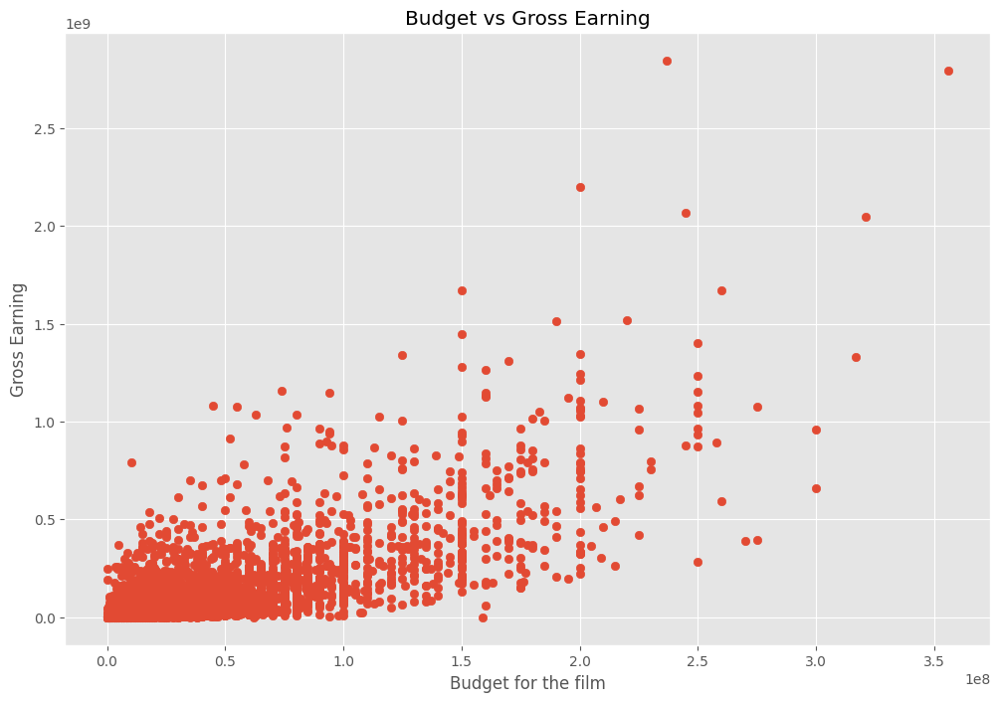

In [13]:
plt.scatter(x=df['budget'],y=df['gross'])
plt.title('Budget vs Gross Earning')
plt.xlabel('Budget for the film')
plt.ylabel('Gross Earning')
plt.show()

**Interpretation**

There is a positive trend here, as the budget increases, the gross revenue tends to increase too.

However, the points are scattered widely, means not all high-budget movies earn a lot.

Some low-budget movies also earned high revenue.

**Observations**

* Most movies cluster at lower budgets (below ~$100M)

* Some movies with huge budgets (~$200M-$350M) earned billions

* But there are also high-budget flops (movies with big spending but low earnings)

**Conclusion**

There is some correlation between spending more and earning more. But budget alone does not guarantee success.

Text(0.5, 1.0, 'Budget vs Gross Revenue')

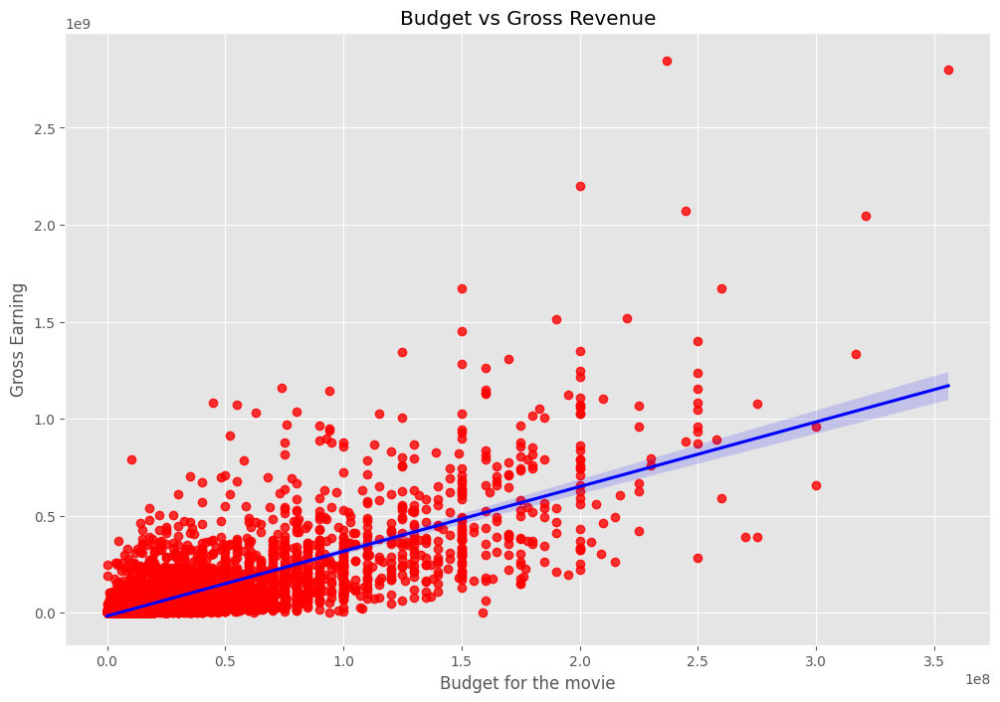

In [14]:
#Plot the budget vs gross using seaborn
sns.regplot(x="budget", y="gross", data=df,
scatter_kws={"color":"red"},
line_kws={"color":"blue"})
plt.xlabel('Budget for the movie')
plt.ylabel('Gross Earning')
plt.title('Budget vs Gross Revenue')

**Explanation**

The regression line in the scatter plot shows a **positive correlation** between movie budget and gross revenue. As the budget increases, the gross earnings also tend to increase. Although the data points are spread out (indicating some variability), the upward slope of the regression line suggests that higher-budget movies generally make more money. This means there is a moderate positive relationship between budget and gross earnings.


In [15]:
# Select only the columns that are naturally numeric (not encoded)
numeric_cols = ['score', 'votes', 'budget', 'gross', 'runtime', 'year']
correlation_matrix = df[numeric_cols].corr(method='pearson')
print(correlation_matrix)

            score     votes    budget     gross   runtime      year
score    1.000000  0.409182  0.076254  0.186258  0.399451  0.045473
votes    0.409182  1.000000  0.442429  0.630757  0.309212  0.070314
budget   0.076254  0.442429  1.000000  0.740395  0.320447  0.321918
gross    0.186258  0.630757  0.740395  1.000000  0.245216  0.250514
runtime  0.399451  0.309212  0.320447  0.245216  1.000000  0.120636
year     0.045473  0.070314  0.321918  0.250514  0.120636  1.000000


In [16]:
#high correlation bet ween budget and gross

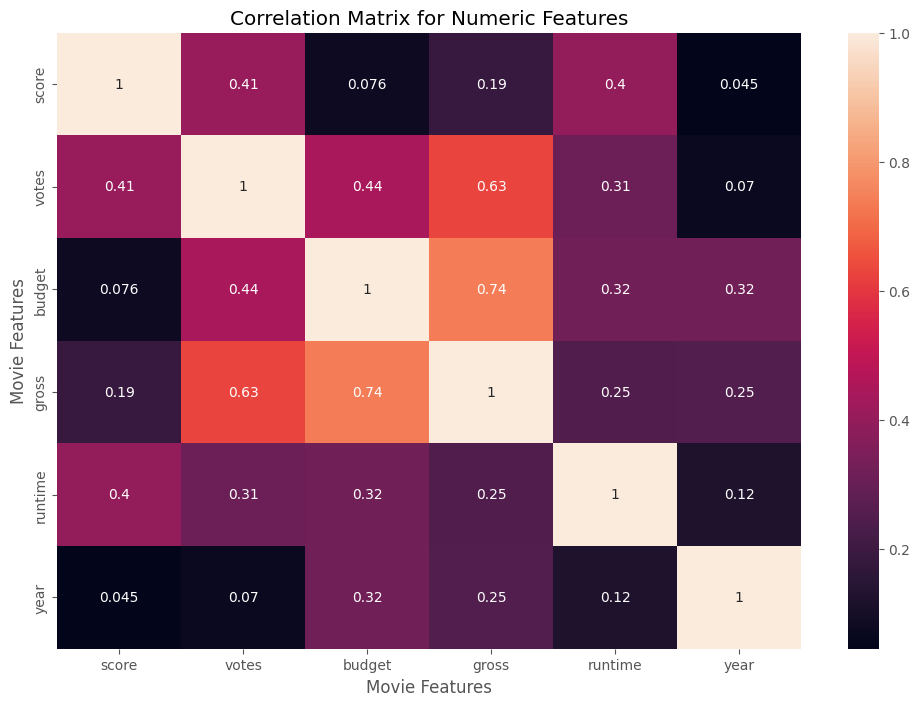

In [17]:
# Select only the columns that are naturally numeric (not encoded)
numeric_cols = ['score', 'votes', 'budget', 'gross', 'runtime', 'year']

correlation_matrix = df[numeric_cols].corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.ylabel('Movie Features')
plt.xlabel('Movie Features')
plt.show()

**Key Findings**
* **Strongest correlations:**

  * Votes and  Gross: 0.63 - Movies with more votes tend to earn more money.
  * Budget and Gross: 0.74 - Bigger budgets strongly correlate with higher earnings.

* **Weak or no Correlation**
  * Score and Year have very weak relationships with other variables (mostly below 0.2).


**Conclusion**

 Budget is the best predictor of box office gross revenue, while critic scores and release year don't tell you much about a movie's financial performance.


In [19]:
df_numerized = df


for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,6587,6,6,1980,1705,8.4,927000.0,2589,4014,1047,54,19000000,46998772,2319,146.0,0
1,5573,6,1,1980,1492,5.8,65000.0,2269,1632,327,55,4500000,58853106,731,104.0,0
2,5142,4,0,1980,1771,8.7,1200000.0,1111,2567,1745,55,18000000,538375067,1540,124.0,0
3,286,4,4,1980,1492,7.7,221000.0,1301,2000,2246,55,3500000,83453539,1812,88.0,0
4,1027,6,4,1980,1543,7.3,108000.0,1054,521,410,55,6000000,39846344,1777,98.0,0


In [19]:
df_original = pd.read_csv('movies.csv')

numeric_columns = ['score', 'votes', 'budget', 'gross', 'runtime', 'year']

for col in numeric_columns:
    df_original[col] = pd.to_numeric(df_original[col], errors='coerce')


In [20]:
df_original.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


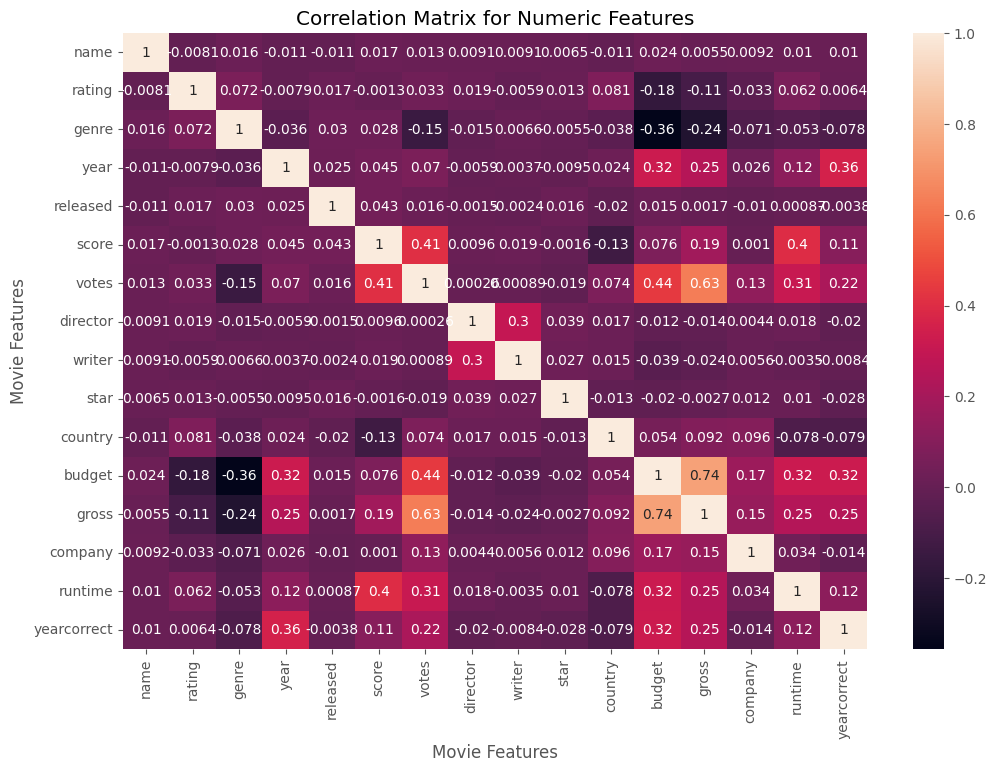

In [21]:
correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.ylabel('Movie Features')
plt.xlabel('Movie Features')
plt.show()

In [22]:
correlation_mat=df_numerized.corr()
corr_pairs = correlation_mat.unstack()
corr_pairs

name         name           1.000000
             rating        -0.008069
             genre          0.016355
             year          -0.010642
             released      -0.011311
             score          0.017097
             votes          0.013088
             director       0.009079
             writer         0.009081
             star           0.006472
             country       -0.010737
             budget         0.023970
             gross          0.005533
             company        0.009211
             runtime        0.010392
             yearcorrect    0.010225
rating       name          -0.008069
             rating         1.000000
             genre          0.072423
             year          -0.007922
             released       0.016613
             score         -0.001314
             votes          0.033225
             director       0.019483
             writer        -0.005921
             star           0.013405
             country        0.081244
             budget        -0.176002
             gross         -0.107339
             company       -0.032943
             runtime        0.062145
             yearcorrect    0.006403
genre        name           0.016355
             rating         0.072423
             genre          1.000000
             year          -0.035768
             released       0.029822
             score          0.027965
             votes         -0.145307
             director      -0.015258
             writer         0.006567
             star          -0.005477
             country       -0.037615
             budget        -0.356564
             gross         -0.235650
             company       -0.071067
             runtime       -0.052711
             yearcorrect   -0.078210
year         name          -0.010642
             rating        -0.007922
             genre         -0.035768
             year           1.000000
             released       0.024619
             score          0.045473
             votes          0.070314
             director      -0.005853
             writer         0.003654
             star          -0.009503
             country        0.024378
             budget         0.321918
             gross          0.250514
             company        0.025615
             runtime        0.120636
             yearcorrect    0.355928
released     name          -0.011311
             rating         0.016613
             genre          0.029822
             year           0.024619
             released       1.000000
             score          0.042788
             votes          0.016097
             director      -0.001478
             writer        -0.002404
             star           0.015777
             country       -0.020427
             budget         0.014683
             gross          0.001659
             company       -0.010474
             runtime        0.000868
             yearcorrect   -0.003775
score        name           0.017097
             rating        -0.001314
             genre          0.027965
             year           0.045473
             released       0.042788
             score          1.000000
             votes          0.409182
             director       0.009559
             writer         0.019416
             star          -0.001609
             country       -0.133348
             budget         0.076254
             gross          0.186258
             company        0.001030
             runtime        0.399451
             yearcorrect    0.106295
votes        name           0.013088
             rating         0.033225
             genre         -0.145307
             year           0.070314
             released       0.016097
             score          0.409182
             votes          1.000000
             director       0.000260
             writer         0.000892
             star          -0.019282
             country        0.073625
             budget         0.442429
    

In [23]:
sorted_pairs=corr_pairs.sort_values()
sorted_pairs

,,0
genre,budget,-0.356564
budget,genre,-0.356564
gross,genre,-0.235650
genre,gross,-0.235650
rating,budget,-0.176002
budget,rating,-0.176002
votes,genre,-0.145307
genre,votes,-0.145307
country,score,-0.133348
score,country,-0.133348


In [24]:
high_corr = sorted_pairs[(sorted_pairs)>0.5]
high_corr

,,0
votes,gross,0.630757
gross,votes,0.630757
budget,gross,0.740395
gross,budget,0.740395
director,director,1.000000
votes,votes,1.000000
released,released,1.000000
score,score,1.000000
rating,rating,1.000000
name,name,1.000000




**Meaningful correlations**

* Budget and  Gross: 0.74 - Strongest relationship! Movies with bigger budgets earn more.
* Votes and  Gross: 0.63 - Popular movies (more votes) earn more money.

**Company, director, and genre DO affect gross revenue in real life, but you can't measure it with Pearson correlation on encoded labels.**